## Main figures

## Figure 6: (6B) Seasonality ratio map of annual and semiannual oscillations from the Mean Seasonal Cycle (MSC) and (6A) plots from three pixels

### Estupinan-Suarez, et al. (2021). A Regional Earth System Data Lab for Understanding Ecosystem Dynamics: An Example from Tropical South America. Front. Earth Sci. 9:613395. doi: 10.3389/feart.2021.613395
#### Correspondence to: lestup@bgc-jena.mpg.de, linamaesu@gmail.com
#### GitHub repository: https://github.com/linamaes/Regional_ESDL

This script does the following:
- Computes the Mean Seasonal Cycle (MSC) of the first principal component from the PCA analysis. For more details about PCA analysis see script 03 - PCA processing.
- Imports and applies a mask based on MODIS quality flags. See the mask generation script 01.
- Calcultes the ratio between annual and semiannual oscillation based on the Fast Fourier Spectrum.

About the notebook
- It is written in Julia 1.3
- "#" comments in the code are intended to explain specific aspects of the coding
- New steps in workflows are introduced with bold headers

March 2021, Max Planck Institute for Biogeochemistry, Jena, Germany

## Load Packages

In [1]:
using ESDL

In [2]:
using ESDLPlots

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-863200571502338939\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-8585086238704177971\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-863200571502338939\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

In [3]:
using Plots

In [4]:
using FFTW

In [5]:
using Distributed

In [6]:
using CSV

In [7]:
using DelimitedFiles

In [8]:
gr(size=(600,400))
default(fmt = :png)

## Paths for loading and saving files

In [9]:
pathmask = ".../my_pathin/" 
pathout = ".../my_pathout/"

".../my_pathout/"

## Load data

In [11]:
pcacom = loadCube("pcacomstdTS1pc1km2014_mask") # Component 1

ZArray Cube with the following dimensions
Time                Axis with 644 Elements from 2001-01-05T00:00:00 to 2014-12-31T00:00:00
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 27.81 GB


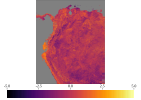

In [12]:
plotMAP(pcacom, time=Date(2007,12,31), dmin=-5, dmax=5)

In [13]:
cmsc = getMSC(pcacom)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:49


ZArray Cube with the following dimensions
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.99 GB


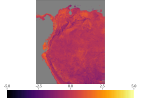

In [14]:
plotMAP(cmsc, MSC=Date(1900,1,1), dmin=-5, dmax=5)

## Load mask

In [15]:
# Load mask
maskin = CSV.read(string(pathmask, "msc_missings_mask.csv"), header=false);

In [16]:
# Convert NaNs to missings and transpose matrix
mask = map(x-> isnan(x) ? missing : x==0 ? missing : x, Matrix(maskin));
mask = mask' |> Array;

## Apply mask

In [17]:
function maskout(xout, xin, mask)
    xout[:] = xin.*mask
end

maskout (generic function with 1 method)

In [18]:
indims = InDims("Lon","Lat")
outdims = OutDims("Lon","Lat")

OutDims((ESDL.Cubes.Axes.ByName("Lon"), ESDL.Cubes.Axes.ByName("Lat")), (), zero, identity, :auto, false, AsArray(), :input, Zarr.NoCompressor(), "", false, 1)

In [19]:
cmscm = mapCube(maskout, cmsc, mask, indims=indims, outdims=outdims)

┌ Warning: There are still cache misses
└ @ ESDL.DAT /Net/Groups/BGI/scratch/lestup/julia_atacama_depots/packages/ESDL/skMpG/src/DAT/DAT.jl:608
Progress: 100%|█████████████████████████████████████████| Time: 0:00:41


ZArray Cube with the following dimensions
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Total size: 1.99 GB


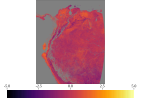

In [20]:
plotMAP(cmscm, MSC=Date(1900,1,1), dmin=-5, dmax=5)

##  Figure 6B - Ratio map between annual and semiannual oscillations

In [21]:
# This fuction computes the ratio between 2nd and (3rd+4th) fft frequency power
# from fftw (fft[2]/(fft[3]+fft[4])

function spratioFx2(xin)
    any(ismissing, xin) && return missing
    xfft = fft(convert(Vector{Float64}, xin))
    xout = abs(xfft[2])/(abs(xfft[3])+abs(xfft[4]))
end

spratioFx2 (generic function with 1 method)

In [22]:
ratiosp2 = mapslices(spratioFx2, cmscm, dims="MSC")

Progress: 100%|█████████████████████████████████████████| Time: 0:05:40


In-Memory data cube with the following dimensions
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 44.22 MB


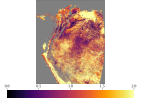

In [23]:
# Colors differ with the publication colorscheme. The publication map was done using matplotlib in Python
plotMAP(ratiosp2, dmin=0, dmax=2)

In [24]:
ratioout2 = map(x -> ismissing(x) ? NaN : x, (ratiosp2[:,:]' |> Matrix));
# writedlm(string(pathout,"ratio_annual_semiannual_maskosc234.csv"), ratioout2, ",")

### Percentage annual and semiannual oscillations

In [25]:
function perAnnSemFx(xin)
    any(ismissing, xin) && return missing
    xfft = fft(convert(Vector{Float64}, xin))
    absx = map(x->abs(x), xfft)
    xout = (abs(xfft[2])+abs(xfft[3])+abs(xfft[4]))/sum(absx[2:23])
    return xout
end

perAnnSemFx (generic function with 1 method)

In [26]:
percentannsem = mapslices(perAnnSemFx, cmsc, dims="MSC")

Progress: 100%|█████████████████████████████████████████| Time: 0:06:33


In-Memory data cube with the following dimensions
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 44.22 MB


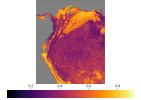

In [27]:
plotMAP(percentannsem)

## Figure 6A - MSC plots by pixels

### TS decomposition using Fast Fourier

In [28]:
addprocs(8);

In [29]:
@everywhere using ESDL

In [30]:
cfft = filterTSFFT(pcacom)

Progress: 100%|█████████████████████████████████████████| Time: 0:04:16m


ZArray Cube with the following dimensions
Time                Axis with 644 Elements from 2001-01-05T00:00:00 to 2014-12-31T00:00:00
Scale               Axis with 4 elements: Trend Long-Term Variability Annual Cycle Fast Oscillations 
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 111.24 GB


In [31]:
cfftmsc = getMSC(cfft[Scale="Annual Cycle"])

Progress: 100%|█████████████████████████████████████████| Time: 0:00:24


ZArray Cube with the following dimensions
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.99 GB


In [32]:
rmprocs(workers())

Task (done) @0x00007f29d9c2fd00

In [33]:
cfftmscm = mapCube(maskout, cfftmsc, mask, indims=indims, outdims=outdims)

┌ Warning: There are still cache misses
└ @ ESDL.DAT /Net/Groups/BGI/scratch/lestup/julia_atacama_depots/packages/ESDL/skMpG/src/DAT/DAT.jl:608
Progress: 100%|█████████████████████████████████████████| Time: 0:00:44


ZArray Cube with the following dimensions
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Total size: 1.99 GB


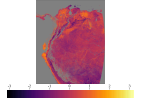

In [34]:
plotMAP(cfftmscm, MSC=Date(1900,1,1))

### Calculate mean seasonal standard deviation of PC1 TS

In [35]:
addprocs(6);

In [36]:
pcacom

ZArray Cube with the following dimensions
Time                Axis with 644 Elements from 2001-01-05T00:00:00 to 2014-12-31T00:00:00
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 27.81 GB


In [37]:
@everywhere function getsdSC(xout, xin, timeax)
    any(ismissing, xin) && return missing
    timedoy = map(x->Dates.dayofyear(x), timeax)
    #xout = zeros(46)
    for i in 1:46 
        idx = findall(x-> x==timedoy[i], timedoy)
        xout[i] = std(map(x->xin[x], idx))
    end
    return xout
end

In [38]:
axmsc = cmsc.axes[1]

MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00

In [39]:
indimssdsc = InDims("Time")
outdimssdsc = OutDims(axmsc)

OutDims((ESDL.Cubes.Axes.ByValue(MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00),), (), zero, identity, :auto, false, AsArray(), :input, Zarr.NoCompressor(), "", false, 1)

In [40]:
@everywhere using Dates, OnlineStats

In [41]:
tall = collect(pcacom.axes[1].values);

In [42]:
csdsc = mapCube(getsdSC, pcacom, tall, indims=indimssdsc, outdims=outdimssdsc)

Progress: 100%|█████████████████████████████████████████| Time: 0:01:08


ZArray Cube with the following dimensions
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.99 GB


In [43]:
csdscfft = mapCube(getsdSC, cfft[Scale="Annual Cycle"], tall, indims=indimssdsc, outdims=outdimssdsc)

Progress: 100%|█████████████████████████████████████████| Time: 0:01:08


ZArray Cube with the following dimensions
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
Total size: 1.99 GB


In [44]:
 rmprocs(workers())

Task (done) @0x00007f29ab2735b0

In [45]:
csdscm = mapCube(maskout, csdsc, mask, indims=indims, outdims=outdims)

┌ Warning: There are still cache misses
└ @ ESDL.DAT /Net/Groups/BGI/scratch/lestup/julia_atacama_depots/packages/ESDL/skMpG/src/DAT/DAT.jl:608
Progress: 100%|█████████████████████████████████████████| Time: 0:00:44


ZArray Cube with the following dimensions
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Total size: 1.99 GB


In [46]:
csdscfftm = mapCube(maskout, csdscfft, mask, indims=indims, outdims=outdims)

┌ Warning: There are still cache misses
└ @ ESDL.DAT /Net/Groups/BGI/scratch/lestup/julia_atacama_depots/packages/ESDL/skMpG/src/DAT/DAT.jl:608
Progress: 100%|█████████████████████████████████████████| Time: 0:00:42


ZArray Cube with the following dimensions
Lon                 Axis with 2760 Elements from -82.99622135 to -60.00464665
Lat                 Axis with 3360 Elements from 13.99613735 to -13.99541735
MSC                 Axis with 46 Elements from 1900-01-01T00:00:00 to 1900-12-27T00:00:00
Total size: 1.99 GB


In [47]:
workers()

1-element Array{Int64,1}:
 1

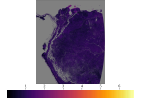

In [48]:
plotMAP(csdscm, MSC=Date(1900,1,1))

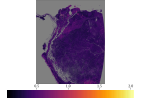

In [49]:
plotMAP(csdscfftm, MSC=Date(1900,12, 27))

## Save cubes

In [25]:
# saveCube(ratiosp2, "ratio_annual_semiannual_pca1kmstd2014_mask")

In [50]:
# saveCube(cmscm, "pcacom1msc1km2014_mask")

In [51]:
# saveCube(cfftmscm, "pcafftmsc1kmstd2014_mask")

In [52]:
# saveCube(csdscm, "pcacom1sdsc1km2014_mask")

In [53]:
# saveCube(csdscfftm, "pcafftsdsc1kmstd2014_mask")

## Plot MSC for some pixels

In [54]:
# Get the longitude and latitude coordinates
lonaxc = collect(cmsc.axes[2].values)
lataxc = collect(cmsc.axes[3].values);

In [55]:
# Define days of the year from MSC
taxin = collect(cmsc.axes[1].values);
tax = map(x->Dates.dayofyear(x), taxin);

In [56]:
# foldp = "plots/pxs" 

# Define function for plotting

function plotpx(clon, clat)

    titlen = "\nRatio = "#"\nRatio (ann/sem) = "
    titlen2 = "  Fraction = " #"\nPercentage (ann&sem) = "

    
    coordout = string("Px. coord: Lat. ", round(lataxc[clat], digits=2) ,"°, Lon. ", round(lonaxc[clon], digits=2),"°",
        titlen, round(ratiosp2[clon,clat], digits=2),
        titlen2, round(percentannsem[clon,clat], digits=2))

    p1 = plot(tax, cmsc[:,clon, clat].*-1, label  = "PC1 MSC", color="black",
        ribbon=csdsc[:,clon,clat], fillalpha=0.1, lw=1, 
        xlabel="Day of year", xguidefontsize=14, xtickfontsize=15,
        ylim=(-3, 3), yguidefontsize=14,  ytickfontsize=15, #ylabel="PC1",
        title=coordout, titlefontsize = 12, legendfontsize = 7, legend=:false,
        size=(300, 300)) #ylim=(3, 8.52

    plot!(tax, cfftmsc[:, clon, clat].*-1, label = "FFT (annual)", lw=3, color="orange")
    
#     savefig(p1, string(rootp,foldp,"lon_",clon,"lat_",clat,"2014v2_mask",dpix,"dpi.png"))

    return p1
end

plotpx (generic function with 1 method)

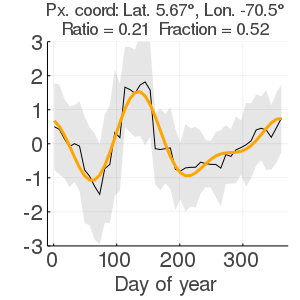

In [57]:
px1 = plotpx(1500, 1000)

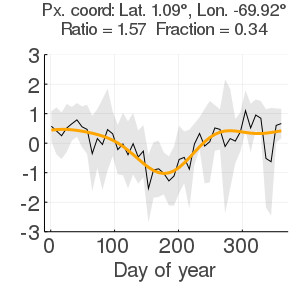

In [58]:
px2 = plotpx(1570, 1550)

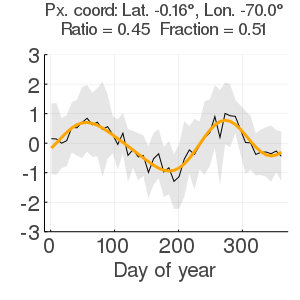

In [59]:
px3 = plotpx(1560, 1700)

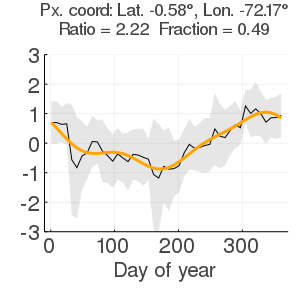

In [60]:
px4 = plotpx(1300,1750)